In [133]:
from PIL import Image, ImageFilter, ImageChops
import sys, os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math

In [52]:
img0 = Image.open('dataset1/0.bmp')
img1 = Image.open('dataset1/1.bmp')
img2 = Image.open('dataset1/2.bmp')
img3 = Image.open('dataset1/3.bmp')
images = [img0, img1, img2, img3]

In [53]:
# Send in np array foe each image
def show_images(images):
    plt.figure(figsize=(200,100))
    columns = 5
    for i, image in enumerate(images):
        plt.subplot(len(images) / columns + 1, columns, i + 1)
        plt.imshow(image)

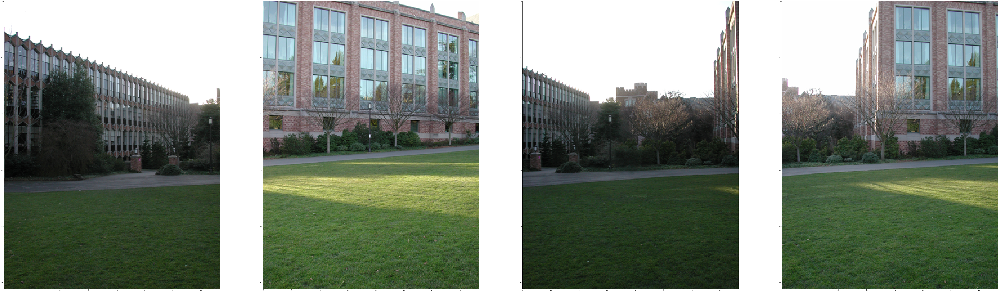

In [44]:
arr = [np.array(i) for i in images]
show_images(arr)

In [108]:
array = [[] for x in range(5)]
# array.append([])
# array[0].append(img0)
array

[[], [], [], [], []]

In [124]:
def scale_space(img, num_octaves, blurs_per_octave, blur_radius=1/math.sqrt(2)):
    img = img.resize((2*img.width, 2*img.height), Image.ANTIALIAS)
    scale_space_images = [[] for x in range(num_octaves)]
    for octave in range(num_octaves):
        if octave:
            img = img.resize((img.width // 2, img.height // 2), Image.ANTIALIAS)
        for blur in range(blurs_per_octave):
            current_blur_radius = blur_radius * 2**(octave) * math.sqrt(2)**blur
            current_image = img.filter(ImageFilter.GaussianBlur(current_blur_radius))
            scale_space_images[octave].append(current_image)
    return scale_space_images

In [126]:
scale_images = scale_space(img0, 4, 5)
# scale_images[0][0]

0.70710678118654751.0       1.41421356237309512.00000000000000042.8284271247461903
1.4142135623730952.0       2.82842712474619034.0000000000000015.656854249492381
2.828427124746194.0       5.6568542494923818.00000000000000211.313708498984761
5.656854249492388.0       11.31370849898476116.00000000000000422.627416997969522


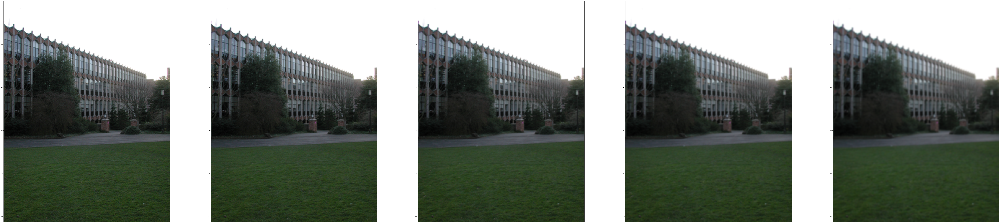

In [130]:
show_images([np.array(x) for x in scale_images[0]])

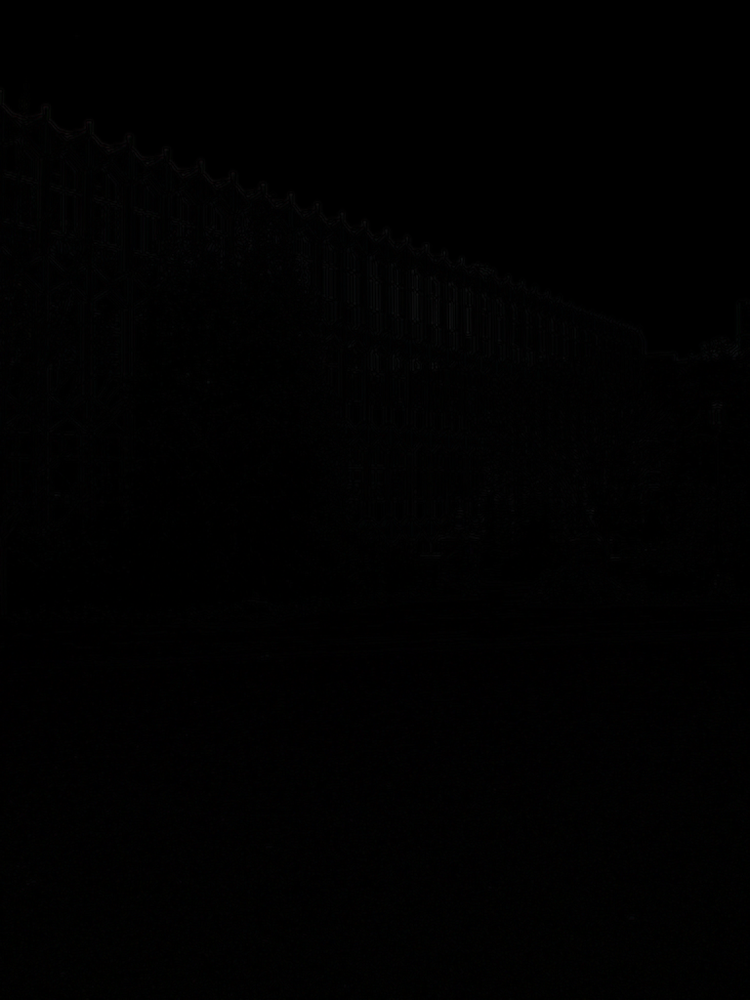

In [134]:
ImageChops.difference(scale_images[0][0], scale_images[0][1])